## Lab 4.2 – Polyp detection: YOLO8 (Ultralytics)
This notebook is used to evaluate the performance of polyp detection models trained on Ultralytics library.

This example code will consist of:

1. **Setup**
2. **Load Dataset**
3. **Train Model**
4. **Inference & Evaluate**

## 1) Setup
The code below install and import all required libraries and defines utility functions that will be used in the rest of this notebook.

In [1]:
# Download library
!pip install ultralytics opencv-python tqdm matplotlib -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 18.8 MB/s eta 0:00:00


In [2]:
# Import library
import os
import shutil
import yaml
import time
import random
from glob import glob
from tqdm import tqdm

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from IPython.display import Video
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## 2) Load Dataset
In this step, the dataset is downloaded from GitHub. The dataset structure is prepared in a format compatible with YOLO. Please refer to the following paths: /content/detect/

In [3]:
!wget https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/polyp_detect.zip
!unzip -q -o 'polyp_detect.zip'

--2026-06-13 12:15:48--  https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/polyp_detect.zip
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/polyp_detect.zip [following]
--2026-06-13 12:15:48--  https://media.githubusercontent.com/media/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/polyp_detect.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 33504992 (32M) [application/zip]
Saving to: ‘polyp_detect.zip’

polyp_detect.zip    100%[===================>]  31.95M  --.-KB/s    in 0.1s    

2026-

## 3) Train Model

In [4]:
# Create model and load pre-train from ultralytics hub
model = YOLO("yolov8s.pt")

In [5]:
# This cell will take approximately 5-10 minutes to process.
model.train(
    data="/content/detect/Kvasir_ultrahub.yaml",
    epochs=50,
    imgsz=320,
    batch=8,
    name="yolo_kvasir_detect",
    workers=2, # The number of processes/threads that PyTorch DataLoader will create to read and prepare data.
    seed=2026
)

Ultralytics 8.4.66 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/detect/Kvasir_ultrahub.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo_kvasir_detect, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c371a13c6b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [6]:
from PIL import Image

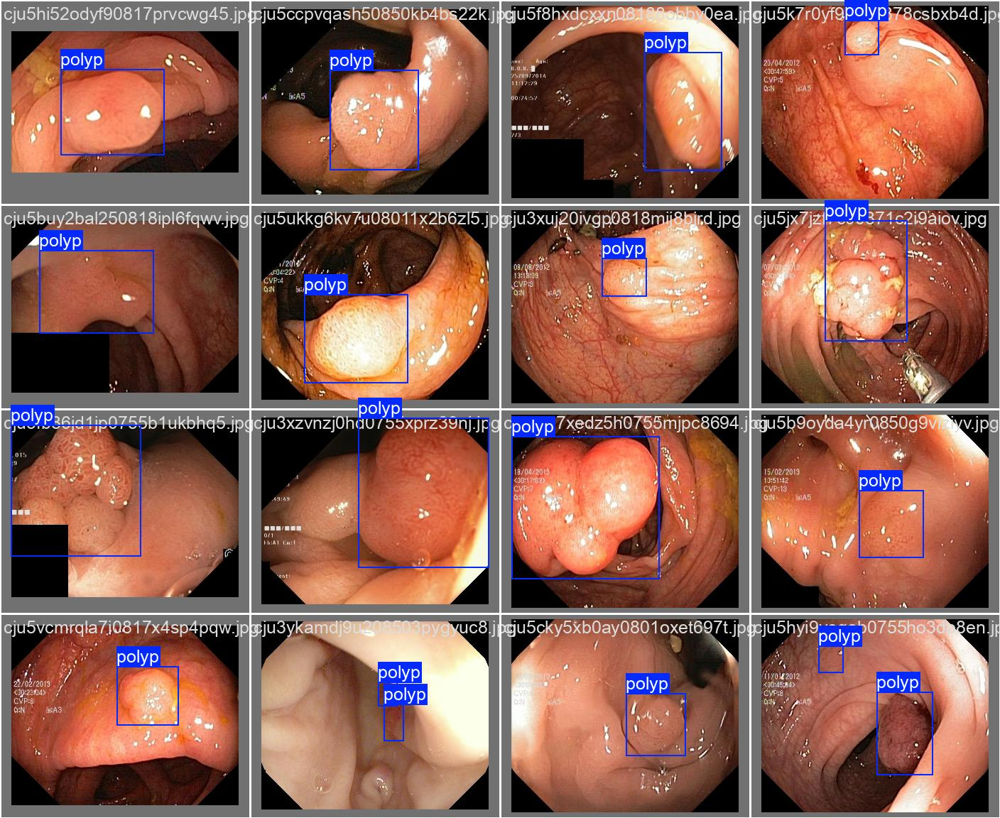

In [7]:
# Example image (validation dataset)
Image.open("/content/runs/detect/yolo_kvasir_detect/val_batch0_labels.jpg")

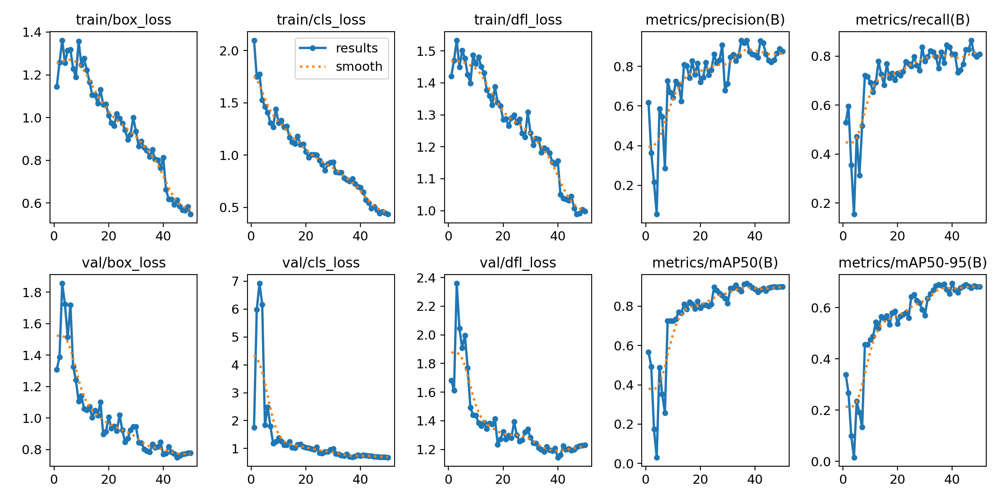

In [8]:
Image.open("/content/runs/detect/yolo_kvasir_detect/results.png")

## 4) Inference & Evaluate

In [9]:
model = YOLO('/content/runs/detect/yolo_kvasir_detect/weights/best.pt')


0: 288x320 1 polyp, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 320)


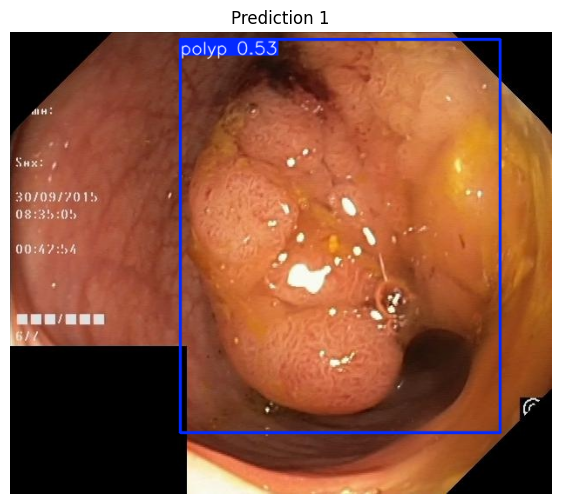

In [10]:
# Inference (image)
test_imgs = glob("detect/images/test/*.jpg")[:1]
results = model.predict(test_imgs, conf=0.3)

for i, r in enumerate(results):
    img = r.plot()[:, :, ::-1]
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Prediction {i+1}")
    plt.show()

In [11]:
# results(Boxes)
results[0].boxes.data # [x1,y1,x2,y2, confidence score,class]

tensor([[1.9594e+02, 8.1388e+00, 5.6201e+02, 4.6036e+02, 5.3372e-01, 0.0000e+00]], device='cuda:0')

In [12]:
def bbox_iou(box1, box2):
    """
    box: [x1, y1, x2, y2]
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter = max(0, x2 - x1) * max(0, y2 - y1)

    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union = area1 + area2 - inter
    return inter / union if union > 0 else 0

In [13]:
# Evaluate
# Mean IoU
test_imgs = glob("detect/images/test/*.jpg") + glob("detect/images/test/*.png")
print(f"Testing {len(test_imgs)} test images...")

ious, times = [], []

for img_path in tqdm(test_imgs, desc="Evaluating YOLOv8 Detection"):
    img = cv2.imread(img_path)
    if img is None:
        continue

    # Inference
    start = time.time()
    results = model.predict(img, conf=0.3, verbose=False)
    times.append(time.time() - start)

    # No detection
    if results[0].boxes is None or len(results[0].boxes) == 0:
        continue

    # ใช้ bbox ที่ confidence สูงสุด
    pred_box = results[0].boxes.xyxy[0].cpu().numpy()

    # -------------------------
    # Load GT bounding box
    # -------------------------
    label_path = os.path.join(
        "/content/detect/labels/test",
        os.path.splitext(os.path.basename(img_path))[0] + ".txt"
    )
    if not os.path.exists(label_path):
        continue

    with open(label_path) as f:
        gt = f.readline().strip().split()

    # YOLO format → xyxy
    cls, xc, yc, w, h = map(float, gt)

    H, W = img.shape[:2]
    gt_box = [
        (xc - w / 2) * W,
        (yc - h / 2) * H,
        (xc + w / 2) * W,
        (yc + h / 2) * H,
    ]

    iou = bbox_iou(pred_box, gt_box)
    ious.append(iou)

print("\n YOLOv8 Detection Performance:")
print(f"• Mean IoU: {np.mean(ious):.4f}")
print(f"• Avg inference time: {np.mean(times)*1000:.2f} ms/img")

Testing 100 test images...


Evaluating YOLOv8 Detection: 100%|██████████| 100/100 [00:01<00:00, 70.33it/s]


 YOLOv8 Detection Performance:
• Mean IoU: 0.8078
• Avg inference time: 10.27 ms/img


In [14]:
# Download video
!wget https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/video.mp4

--2026-06-13 12:20:21--  https://github.com/pvateekul/digitalhealth-ai2025/raw/main/code/Class04_YOLO/video.mp4
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/video.mp4 [following]
--2026-06-13 12:20:21--  https://raw.githubusercontent.com/pvateekul/digitalhealth-ai2025/main/code/Class04_YOLO/video.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4496629 (4.3M) [application/octet-stream]
Saving to: ‘video.mp4’

video.mp4           100%[===================>]   4.29M  --.-KB/s    in 0.04s   

2026-06-13 12:20:22 (101 MB/s) - ‘video.mp4’ sav

In [15]:
# Inference (video)
cap = cv2.VideoCapture("video.mp4")

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter(
    "output.mp4",
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w, h)
)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame, conf=0.3)[0]

    annotated = results.plot()  # วาด bbox
    out.write(annotated)

cap.release()
out.release()

In [16]:
!ffmpeg -i /content/output.mp4 -vcodec libx264 -acodec aac /content/output_fixed.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [17]:
Video("video.mp4", embed=True)

In [18]:
Video("output_fixed.mp4", embed=True)